ParkSense: Real-time Autonomous Parking Occupancy Detection with OpenCV and Deep Learning

In [ ]:
import os
import cv2
import numpy as np
import operator
import pickle
from keras.models import load_model
from google.colab.patches import cv2_imshow

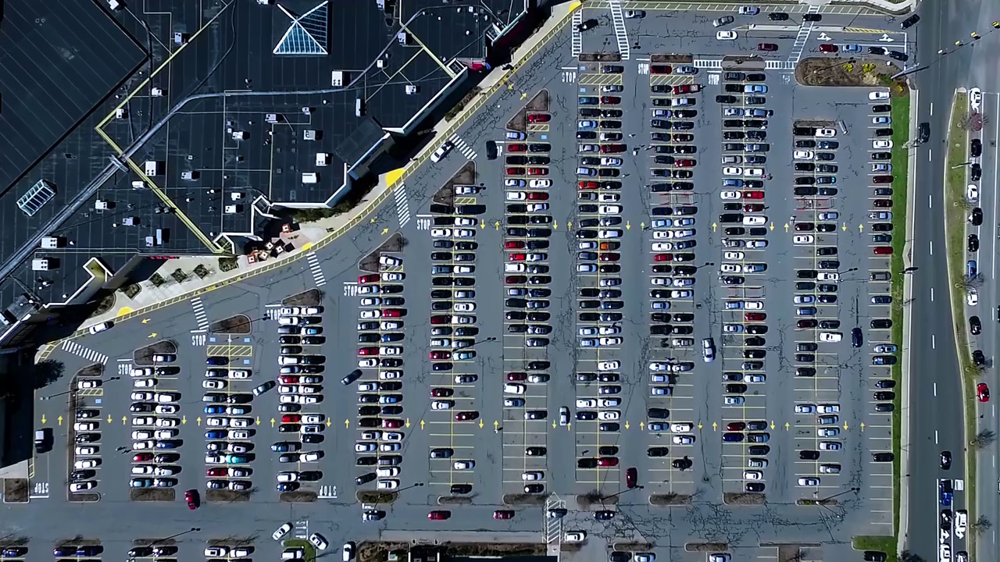

In [ ]:
# Display the image

path = '/content/scene.jpg'
src = cv2.imread(path)
cv2_imshow(src)

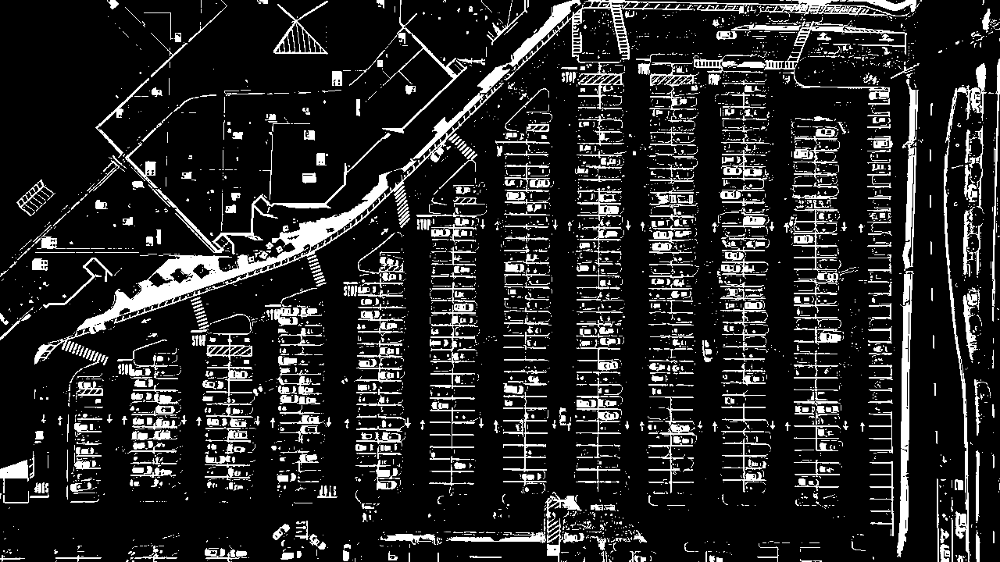

In [ ]:
# Create a mask to highlight specific color range in an RGB image

# Define the color range for masking
lower = np.uint8([120, 120, 120]) # NumPy array of three elements (representing RGB values) where each element is treated as an 8-bit unsigned integer
upper = np.uint8([255, 255, 255]) # the upper limit of the color range in RGB format

# Create the mask, cv2.inRange() function sets all the values that lie within the range to 255 (white) and the rest to 0 (black)
mask = cv2.inRange(src, lower, upper)

# Display the mask
cv2_imshow(mask)

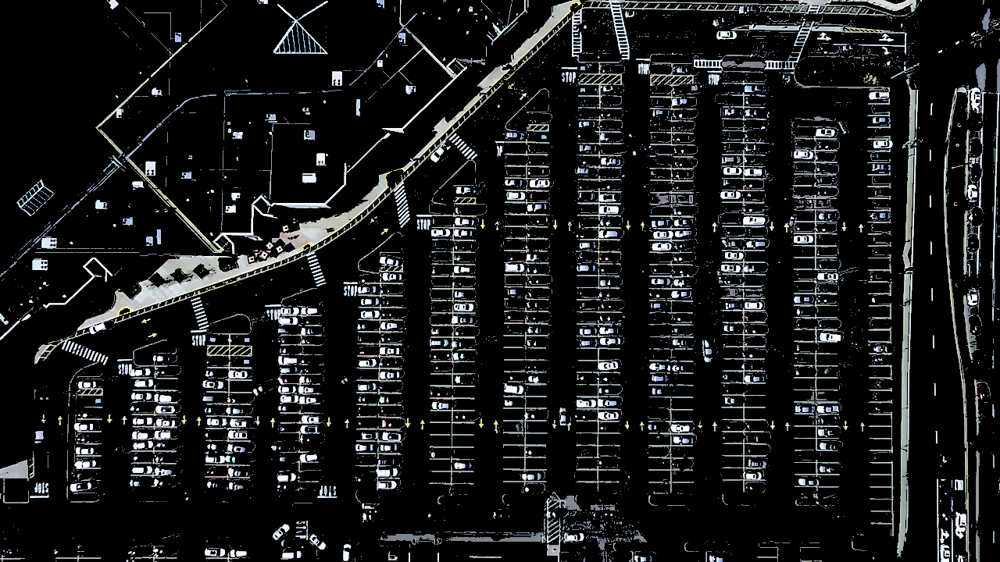

In [ ]:
# Highlights the resulting image where the mask is white, remove background noise

# Give the color to the mask, dst(I) = src1(I) ∧ src2(I) if mask(I) ≠ 0
# when the mask is 0, make img[i] be 0, otherwise leave the pixel alone

bitwise_and_img = cv2.bitwise_and(src, src, mask = mask)
cv2_imshow(bitwise_and_img)

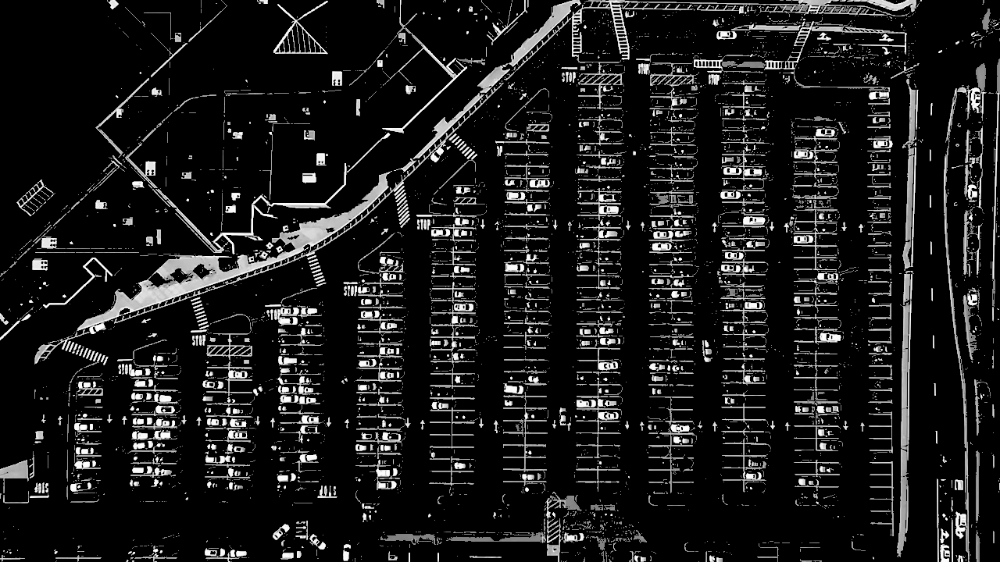

In [ ]:
# Convert to grayscale image

image = cv2.cvtColor(bitwise_and_img, cv2.COLOR_BGR2GRAY)
cv2_imshow(image)

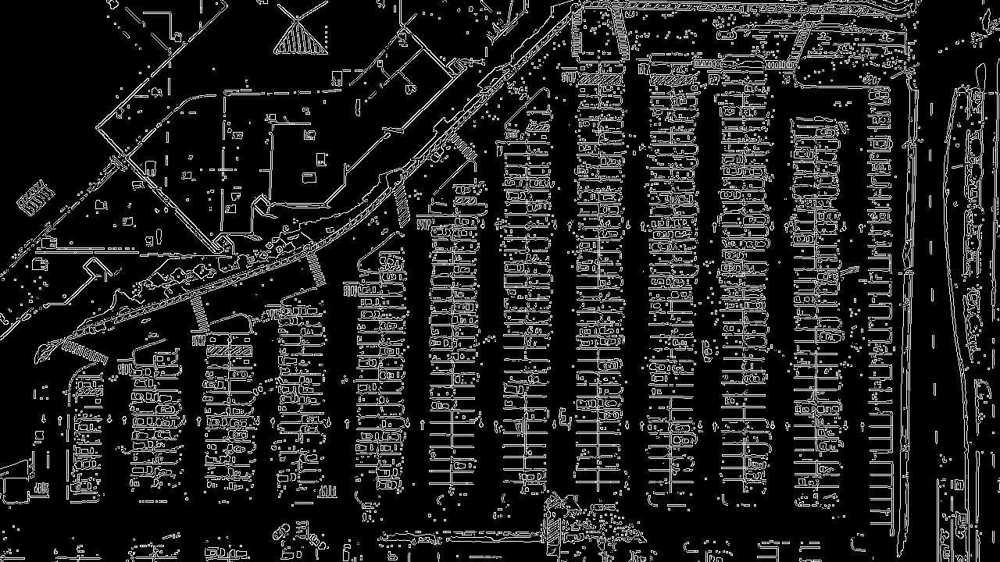

In [ ]:
# Do Canny edge detection

# Setting parameter values, use 2 thresholds to ignore weak and nosiy gradients and ensure all edges are detected and continouus
lower_threshold = 50  # Minimum intensity gradient value, any gradient value below this threshold is rejected
upper_threshold = 150  # Maximum intensity gradient value, any gradient value above this threshold is immediately considered as an edge

# If the pixel gradient is between the two thresholds, then it is weak edge pixels. It will be accepted only if it is connected to stronger edge pixels
# Canny recommended a upper:lower ratio between 2:1 and 3:1.

# Applying the Canny Edge filter
edge = cv2.Canny(image, lower_threshold, upper_threshold)

cv2_imshow(edge) # Output is a binary image where pixels are either black (0) or white (255)

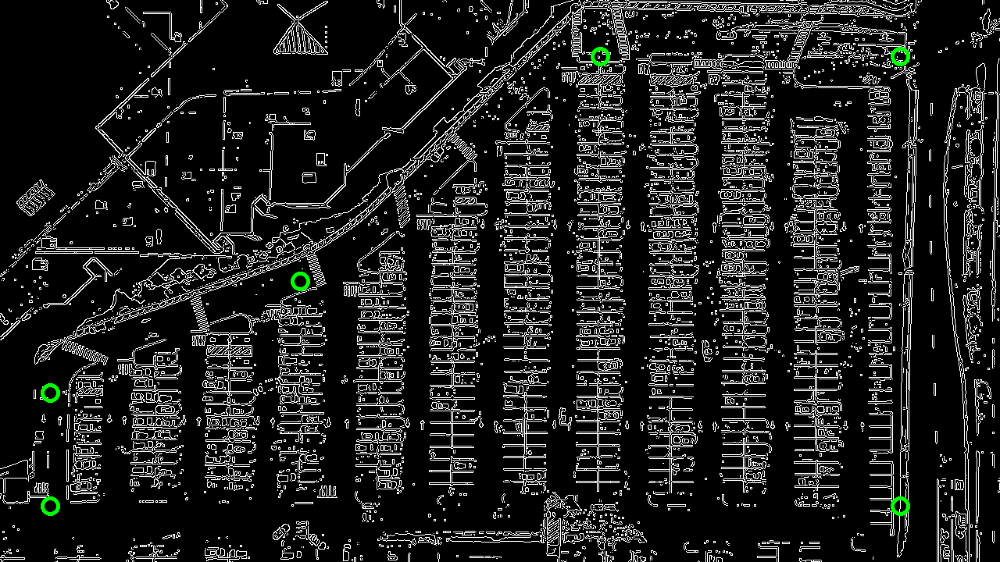

In [ ]:
# Manually select the parking lot area, unpacks the first two elements of the tuple returned by image.shape into two variables row and col

row, col = edge.shape[:2]

coord1 = (col * 0.05, row * 0.70) # leftmost upper
coord2 = (col * 0.05, row * 0.90) # leftmost bottom

coord3 = (col * 0.90, row * 0.90) # rightmost bottom
coord4 = (col * 0.90, row * 0.10) # rightmost upper

coord5 = (col * 0.60, row * 0.10) # middle right
coord6 = (col * 0.30, row * 0.50) # middle left

# Define an array of endpoints of polygon
pts = np.array([coord1, coord2, coord3, coord4, coord5, coord6], np.int32)

# Create an copy of the edge
edge_copy = edge.copy()

# fillPoly requires BGR image
edge_copy = cv2.cvtColor(edge_copy, cv2.COLOR_GRAY2BGR)

# Draw circle on the coordinates to visualize them
for point in pts:
  x, y = point
  cv2.circle(edge_copy, (x, y), 10, (0, 255, 0), 3) # cv2.circle(image, center_coordinates, radius, color, thickness)

cv2_imshow(edge_copy)

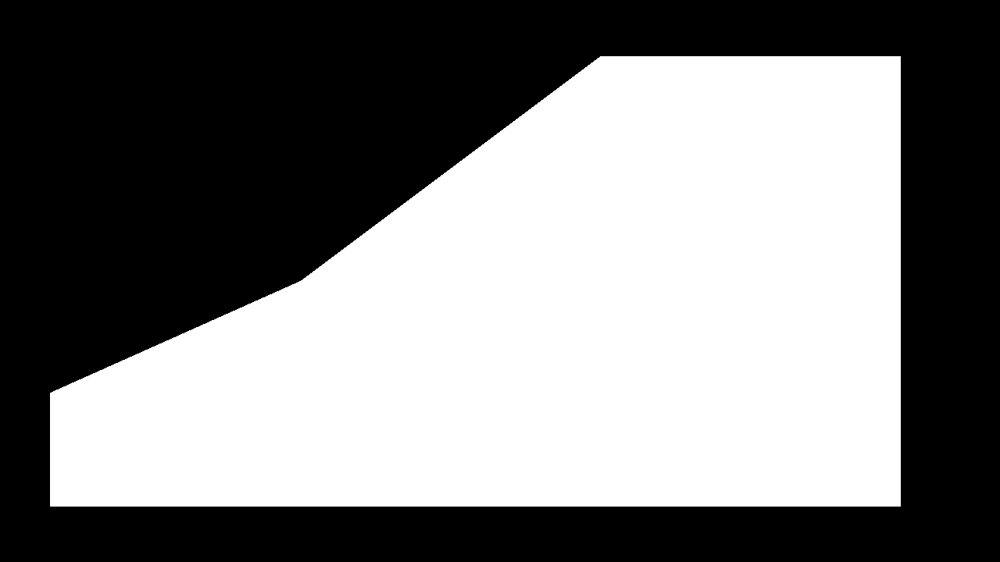

In [ ]:
# Use a filled polygon as a mask to highlight a region of interest

edge_mask = np.zeros_like(edge) # Creates a mask with the same dimensions as the 'edge' but with 0s to define the region where the polygon will be filled
cv2.fillPoly(edge_mask, [pts], 255) # cv2.fillpoly(Image, End_Points, Color)
cv2_imshow(edge_mask)

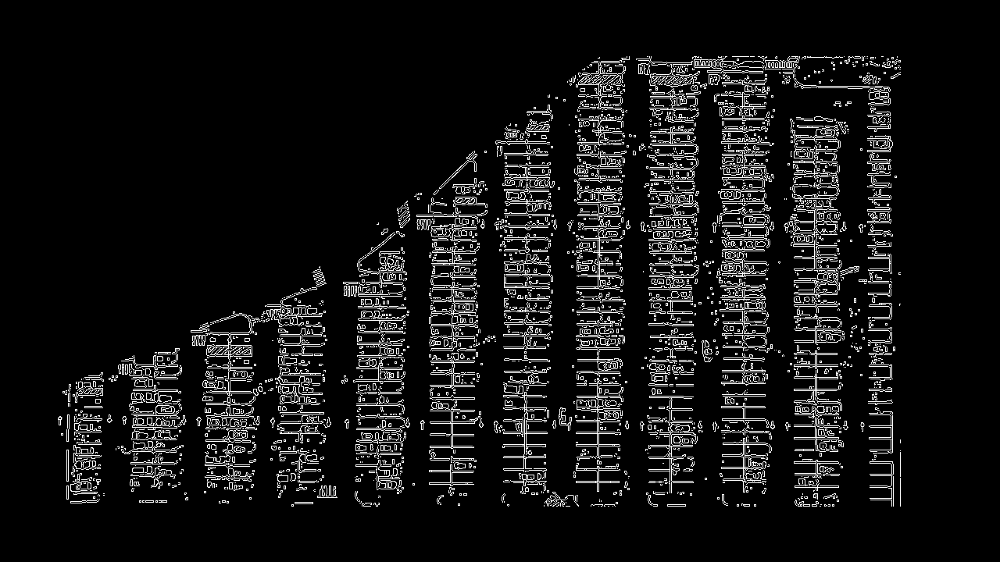

In [ ]:
# Apply the mask to the original image

roi = cv2.bitwise_and(edge, edge_mask)
cv2_imshow(roi)

In [ ]:
# Apply Probabilistic Hough line transformation

# cv2.HoughLinesP(output of the edge detector, rho, theta, threshold, minLineLength, maxLineGap)
# threshold: The minimum vote it should get for being considered as a line
# minLineLength: The minimum number of points that can form a line. Lines with less than this number of points are disregarded.
# maxLineGap: The maximum gap between two points to be considered in the same line.
lines = cv2.HoughLinesP(roi, 0.1, np.pi/10, 15, minLineLength = 4, maxLineGap = 9) # returns a list of lines detected in the image
# Each line is represented by four values [x1, y1, x2, y2], which correspond to the coordinates of the endpoints of the line.
print(lines.shape)

(2529, 1, 4)


Detected:  863


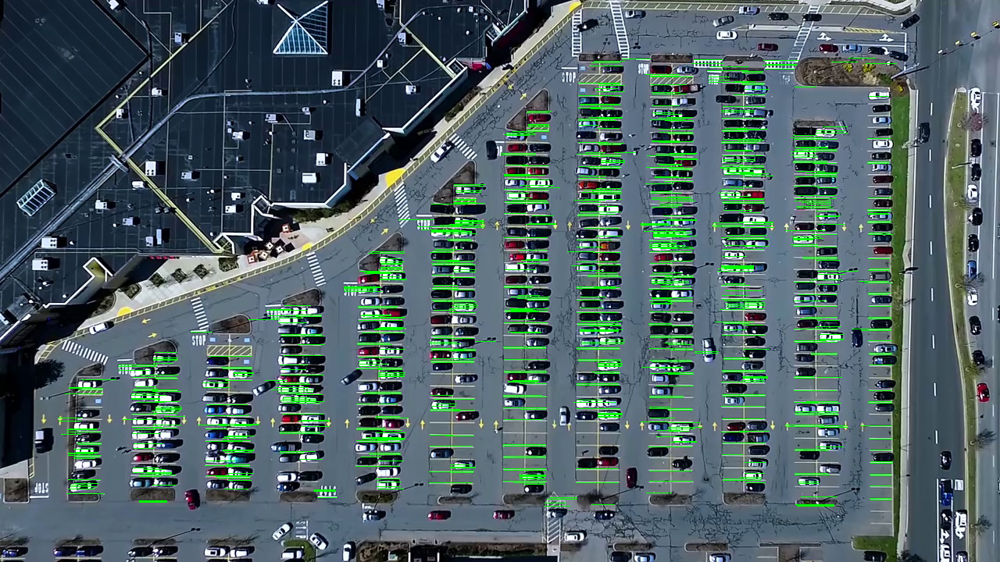

In [ ]:
# Filter the lines: the line cannot be oblique, y-coordinates must be close, and the x-distance must be within a certain range

# Create a copy of the image
img = src.copy()

# Create an list for filtered lines
filtered_lines = []

for line in lines:
    for x1, y1, x2, y2 in line:
        # Check if the line is oblique, x1 x2 is the parking lot length, y1 y2 is the width
        if abs(y2 - y1) <= 1 and abs(x2 - x1) >= 25 and abs(x2 - x1) <= 55:
            # Add the line to the Python list
            filtered_lines.append((x1, y1, x2, y2))
            # cv2.line(image, start_point, end_point, color, thickness)
            cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 1) # start_point: the starting coordinates of the line. The coordinates are represented as tuples of two values i.e. (X coordinate value, Y coordinate value).

print("Detected: ", len(filtered_lines))
cv2_imshow(img)

# Convert the list of filtered lines to a NumPy array, it contains 4 value, x1, x2, y1, y2
filtered_lines = np.array(filtered_lines)

In [ ]:
# Sort the lines

src_copy = np.copy(src)

# itemgetter gets an item from the object, here it is x1, y1
sorted_lines = sorted(filtered_lines, key=operator.itemgetter(0, 1)) # key=operator.itemgetter(0, 1): The sorting should be based on the first (x1) and second (y1) elements of each line tuple.

In [ ]:
# Initialize an empty dictionary to store the line, where each key represents a column index
# and the value is a list of lines belonging to that column

columns = {}

# Initialize the index for the current column
columnIndex = 0

# The maximum distance between lines in the same column
columnDistance = 10

# Iterate over the sorted lines
# Check the distance for the sorted lines, if they are in same column, their x1 value should be close to each other
# If the x1 is much bigger, it will be appended to the next column

for i in range(len(sorted_lines) - 1):
    # Calculate the distance between the x1 coordinates of the current line and the next line
    distance = abs(sorted_lines[i + 1][0] - sorted_lines[i][0])
    # If the distance value is close to each other
    if distance <= columnDistance:
        # If the current column index does not exist in the columns dictionary, initialize it with an empty list
        if columnIndex not in columns:
            columns[columnIndex] = []
        # Append the lines to same row
        columns[columnIndex].append(sorted_lines[i])
        columns[columnIndex].append(sorted_lines[i + 1]) # ensures lines close to each other horizontally are grouped into the same column
    # Otherwise set it to next column
    else:
        columnIndex += 1

In [ ]:
# Find and store each parking lane, here we find the min and max value of x coordinate and y coordinate
# First lane and last lane only have 1 column, all others are 2 columns, we can just calculate average x1, y1 and average x2, y2


# Initialize an empty dictionary to store each lane
lanes = {}

# lane index
i = 0

# Iterate over each key
for column in columns:
    # Get all the lines for the current column index
    lines_in_same_column = columns[column]

    # Remove duplicate lines by converting each line (numpy array) to a tuple
    # so they can be added to a set, then convert back to a list
    # Sets automatically remove duplicate elements
    unique_lines_in_column = list(set(map(tuple, lines_in_same_column)))  # Convert numpy arrays to tuples to make them hashable

    # Each column should have more than 7 lines
    if len(unique_lines_in_column) > 7:

        # Sort the line by y coordinate, so we can find out topmost and bottomost lines in vertical column
        unique_lines_in_column = sorted(unique_lines_in_column, key=lambda x: x[1]) # x represents each element in the list

        top_y = unique_lines_in_column[0][1] # topmost line's y coordinate
        bottom_y = unique_lines_in_column[-1][1] # bottommost line's y coordinate

        # If the distance between the topmost and bottommost line is too small, skip
        if abs(bottom_y - top_y) < 15:
            continue

        x1 = 0
        x2 = 0
        for unique_line in unique_lines_in_column:
            x1 += unique_line[0]  # x-coordinate of the first endpoint of the line
            x2 += unique_line[2]  # x-coordinate of the second endpoint of the line

        # Sum all the x1 and x2 values, and divide by the total of the lines to get the avg value
        avg_x1 = x1 / len(unique_lines_in_column)
        avg_x2 = x2 / len(unique_lines_in_column)

        # Add the lane's coordinate (x1, y1, x2, y2) to the dictionary
        lanes[i] = [avg_x1, top_y, avg_x2, bottom_y]
        i += 1

print('Number of the parking lanes: ', len(lanes))

Number of the parking lanes:  12


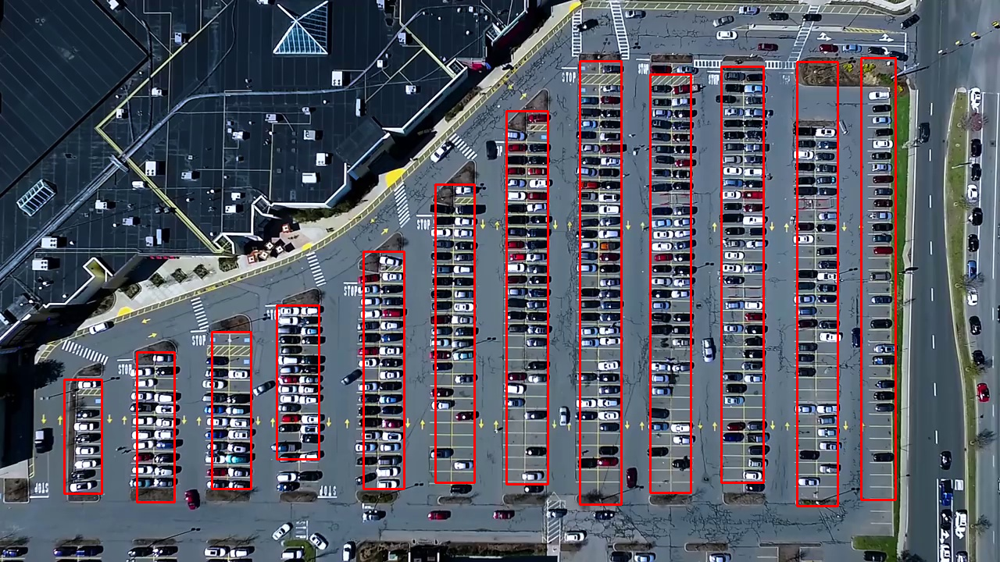

In [ ]:
# Draw the rectangles for each line
adjust = 7

for lane in lanes: # [avg_x1, top_y, avg_x2, bottom_y]

    topLeft = (int(lanes[lane][0] - adjust), int(lanes[lane][1]))
    bottomRight = (int(lanes[lane][2] + adjust), int(lanes[lane][3]))

    # Draw the rectangle
    cv2.rectangle(src_copy, topLeft, bottomRight, (0, 0, 255), 2)

cv2_imshow(src_copy)

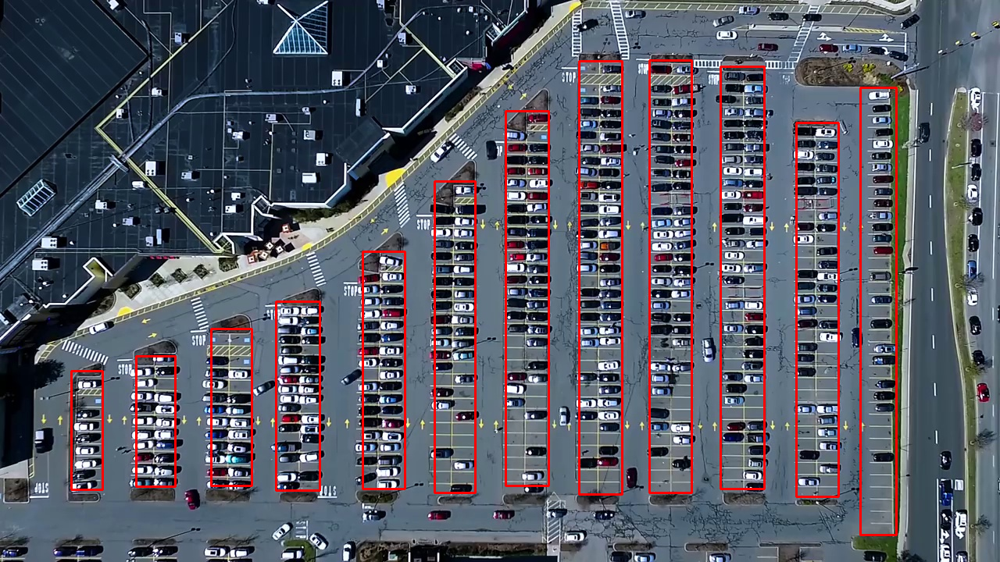

In [ ]:
# Make some adjustments so the rectangle can cover every parking lot

img_copy = np.copy(src)

for i in lanes: # [avg_x1, top_y, avg_x2, bottom_y]

    if i == 0:
        lanes[i][0] += 10
        lanes[i][1] -= 11
        lanes[i][3] -= 5
    elif i == 1:
        lanes[i][1] += 5
        lanes[i][3] -= 20
    elif i == 2:
        lanes[i][1] -= 4
        lanes[i][3] -= 4
    elif i == 3:
        lanes[i][1] -= 5
        lanes[i][3] += 40
    elif i == 5:
        lanes[i][1] -= 4
        lanes[i][3] += 13
    elif i == 6:
        lanes[i][3] += 2
    elif i == 7:
        lanes[i][3] -= 13
    elif i == 8:
        lanes[i][1] -= 18
    elif i == 9:
        lanes[i][3] += 8
    elif i == 10:
        lanes[i][1] += 78
        lanes[i][3] -= 12
    elif i == 11:
        lanes[i][1] += 38
        lanes[i][3] += 45

adjust = 8
for lane in lanes:
      topLeft = (int(lanes[lane][0] - adjust), int(lanes[lane][1]))
      bottomRight = (int(lanes[lane][2] + adjust), int(lanes[lane][3]))
      cv2.rectangle(img_copy, topLeft, bottomRight, (0, 0, 255), 2)
cv2_imshow(img_copy)

10
32
58
90
130
182
244
316
388
458
520
557


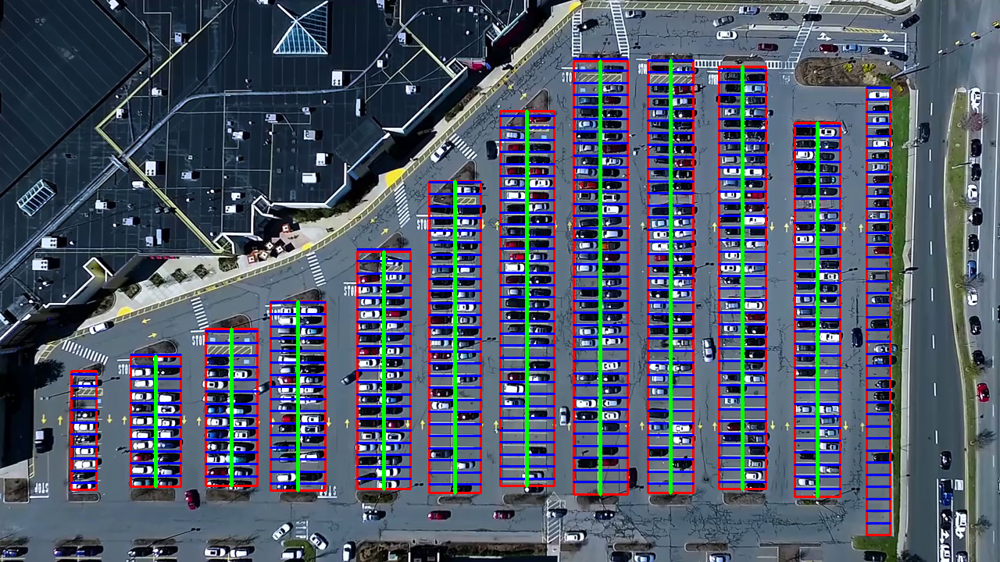

In [ ]:
# Draw each parking spot on the image

parking_img = np.copy(src)

gap = 15.5 # The gap between each parking lot
parking_spots = {} # Dictionary to store each parking spot
total = 0 # Total number of parking spots

# Starting x-coordinate of each lane
start_x_adjustments = {0: -8, 1:-15, 2:-15, 3:-15, 4:-15, 5:-15, 6:-15, 7:-15, 8:-10, 9:-10, 10:-10, 11:0}

# Ending x-coordinate of each lane
end_x_adjustments = {0: 0, 1: 15, 2:15, 3:15, 4:15, 5:15, 6:15, 7:15, 8:10, 9:10, 10:10, 11:0}

# Y-coordinate adjustments for each lane
y_adjustments = {0: 4, 1: -2, 2: 3, 3: 1, 4: -3, 5: 1, 6: 6, 7: -3, 8: 0, 9: 5, 10: 4, 11: 0}

for lane_index in lanes:

        lane_coordinates = lanes[lane_index] # Current lane [avg_x1, top_y, avg_x2, bottom_y]

        x1 = int(lane_coordinates[0] + start_x_adjustments[lane_index])
        x2 = int(lane_coordinates[2] + end_x_adjustments[lane_index])

        y1 = int(lane_coordinates[1]) # Top of the rectangle
        y2 = int(lane_coordinates[3])

        # Draw adjusted rectangle for each column
        cv2.rectangle(parking_img, (x1, y1), (x2, y2), (0, 0, 255), 2)

        rows_per_lane = int(abs(y2 - y1) // gap) # Calculate the rows of each parking lot lane based on the gap value

        for i in range(0, rows_per_lane + 1): # Use row_per_lane + 1 to ensures the last parking spot is closed off
                                              # If using rows_per_lane, leaving the last spot open-ended
            # Draw the horizontal lines within each lane
            y = int(y1 + i * gap) + y_adjustments[lane_index]
            cv2.line(parking_img, (x1, y), (x2, y), (255, 0, 0), 2)

        # If lane_index is not first and last, draw the vertical lanes for each lane
        if lane_index > 0 and lane_index < len(lanes) - 1:
            x = int((x1 + x2) / 2)
            cv2.line(parking_img, (x, y1), (x, y2), (0, 255, 0), 3)

        # Calculate the total parking spots
        if lane_index == 0 or lane_index == len(lanes) - 1:
            total += rows_per_lane + 1
            print(total)
        else:
            total += 2 * (rows_per_lane + 1)
            print(total)

        # Store each parking spot in the dictionary, note here we are already inside for loop (for lane_index in lanes)
        if lane_index == 0 or lane_index == len(lanes) - 1:
            for i in range(0, rows_per_lane + 1):
                # len(parking_spots) will initiazed to 0
                spots_number_per_lane = len(parking_spots)
                y = int(y1 + i * gap) + y_adjustments[lane_index]
                parking_spots[(x1, y, x2, y + gap)] = spots_number_per_lane + 1 # The value is the parking spot number
        else:
            for i in range(0, rows_per_lane + 1):
                spots_number_per_lane = len(parking_spots)
                y = int(y1 + i * gap) + y_adjustments[lane_index]
                x = int((x1 + x2) / 2)
                parking_spots[(x1, y, x, y + gap)] = spots_number_per_lane + 1
                parking_spots[(x, y, x2, y + gap)] = spots_number_per_lane + 2
cv2_imshow(parking_img)

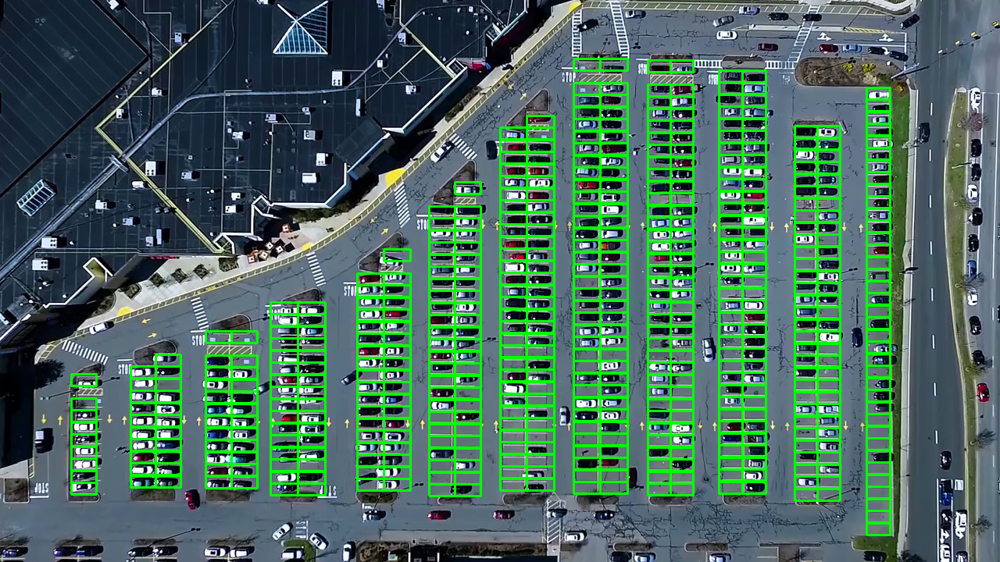

In [ ]:
# Remove invalid spots

invalid_spots = [2, 11, 35, 36, 91, 93, 94, 131, 133, 134, 183, 247,
                248, 319, 320]

valid_spots = {}

index = 1
for key, value in parking_spots.items():
    if value in invalid_spots:
        continue
    valid_spots[key] = index
    index += 1

len(valid_spots)

# Draw each parking spot on the image
test_img = src.copy()

# Iterate over each key in the parking_spots dictionary
for key, value in valid_spots.items():
    cv2.rectangle(test_img, (int(key[0]), int(key[1])), (int(key[2]), int(key[3])), (0, 255, 0) , 2)

cv2_imshow(test_img)

In [ ]:
# Saves a Python dictionary to a file so it can be used later

# Opens a file named spot_dict.pickle in write-binary mode ('wb')
with open('spot_dict.pickle', 'wb') as handle:
    # Serialization: The pickle.dump function converts the valid_spots dictionary into a byte stream
    # and writes it to the spot_dict.pickle file.
    pickle.dump(valid_spots, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
for spot in valid_spots.keys():
    (x1, y1, x2, y2) = spot
    (x1, y1, x2, y2) = (int(x1), int(y1), int(x2), int(y2))

    spot_img = image[y1:y2, x1:x2]
    spot_img = cv2.resize(spot_img, (0, 0), fx = 2.0, fy = 2.0)
    spot_id = valid_spots[spot]

    filename = 'spot_{}.jpg'.format(str(spot_id))
    cv2.imwrite(os.path.join('cnn_data', filename), spot_img)